# Growth rates - US states

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
from matplotlib.dates import DateFormatter

## Data

### COVID-19 data

Source: [The New York Times](https://github.com/nytimes/covid-19-data)

Download updated data:



In [14]:
url = "https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv"
filename = 'data/US_states' + '.csv'
with open(filename, "wb") as f:
    r = requests.get(url)
    f.write(r.content)

Or load a local file until a specific date:

In [15]:
#filename = 'data/US_states_06_08.csv'

In [16]:
df = pd.read_csv(filename)
df = df.dropna()
df.head()

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0


Growh rate raw calculation:

In [17]:
def delta(df_conf):

    list_ = []
    list_.append(0)

    for j in range(len(df_conf) - 1):

        list_.append(df_conf[j+1] - df_conf[j])

    return list_

Select a list of states:

In [18]:
# All
states_ = df['state'].unique()

# Specify
#states_ = np.array(['Washington', 'New York'])

Washington


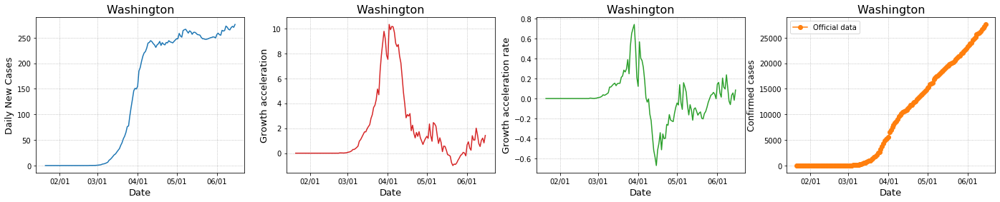

Illinois


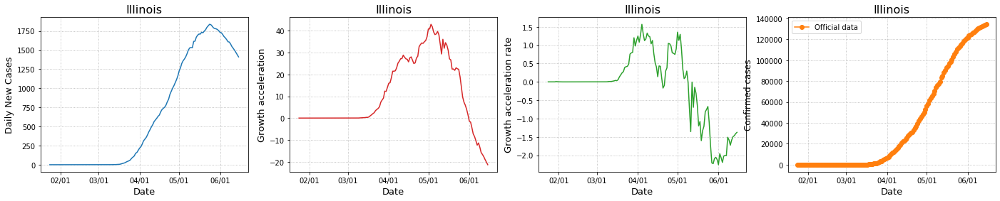

California


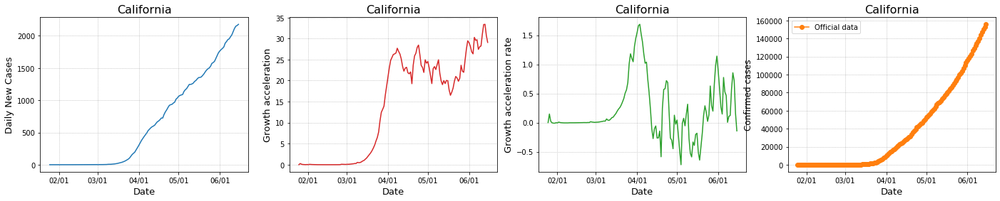

Arizona


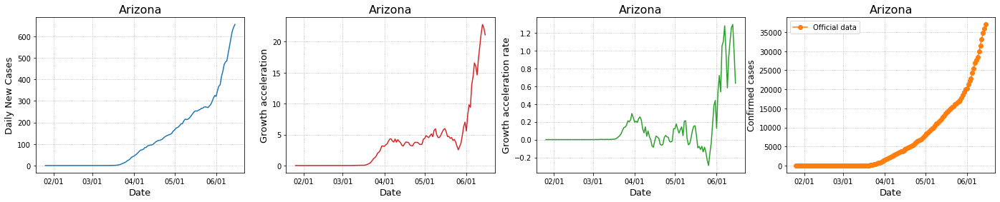

Massachusetts


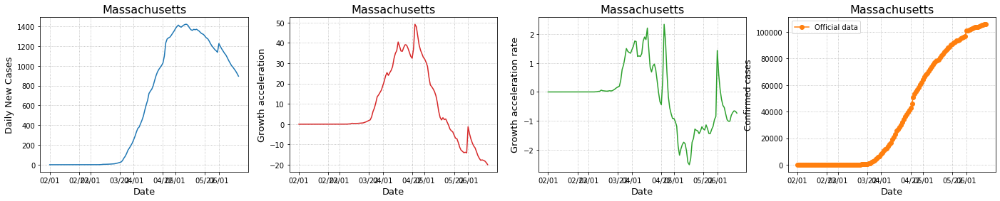

Wisconsin


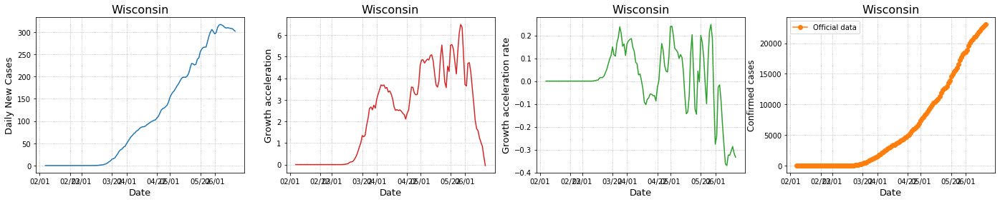

Texas


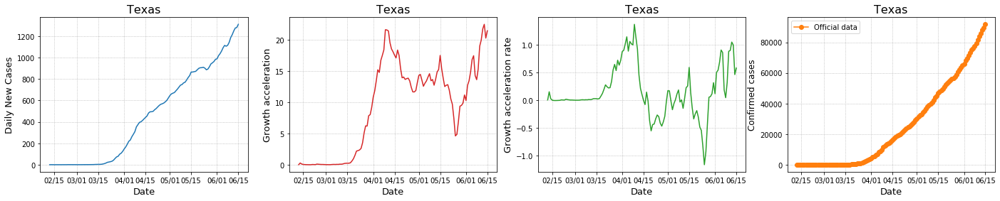

Nebraska


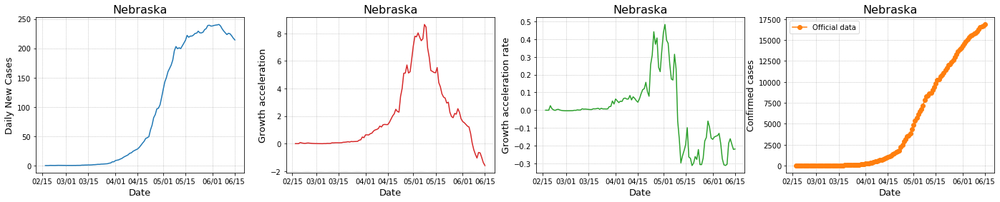

Utah


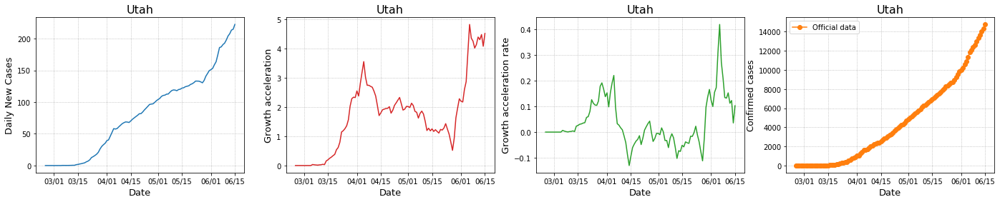

Oregon


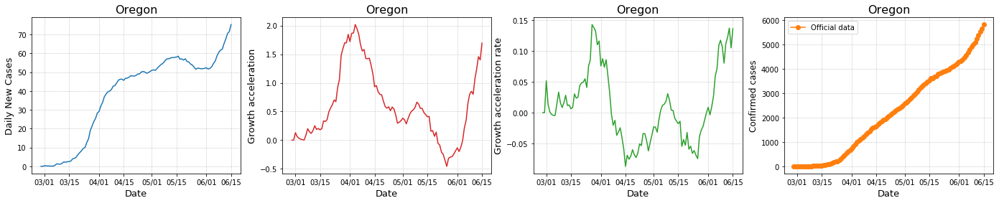

Florida


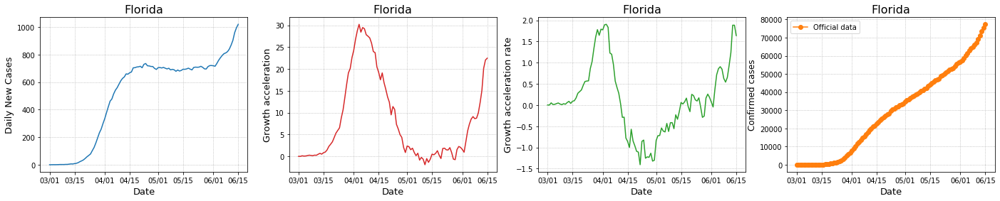

New York


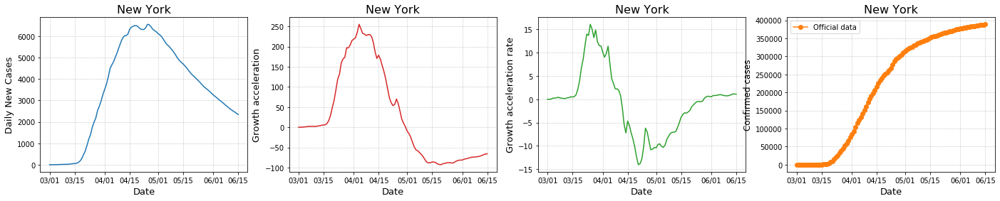

Rhode Island


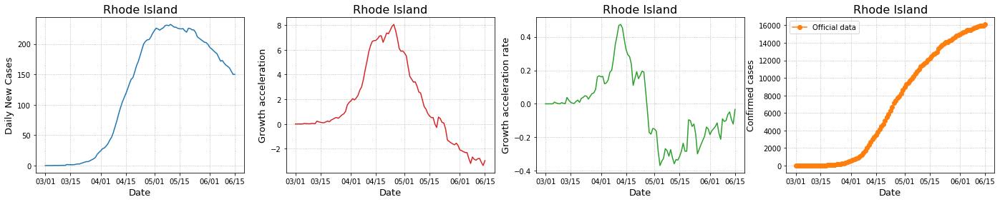

Georgia


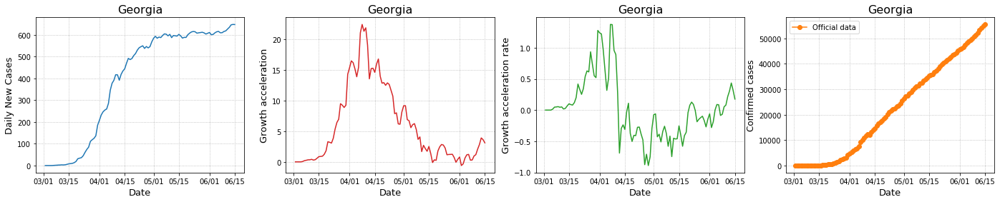

New Hampshire


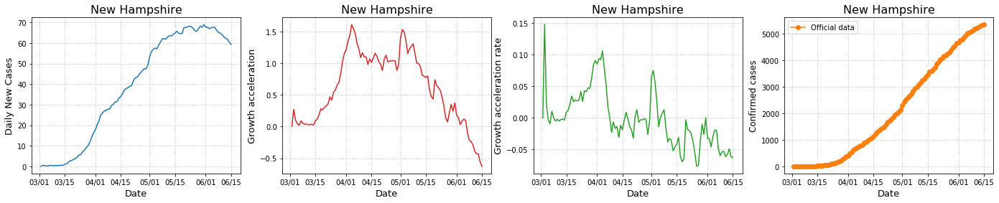

North Carolina


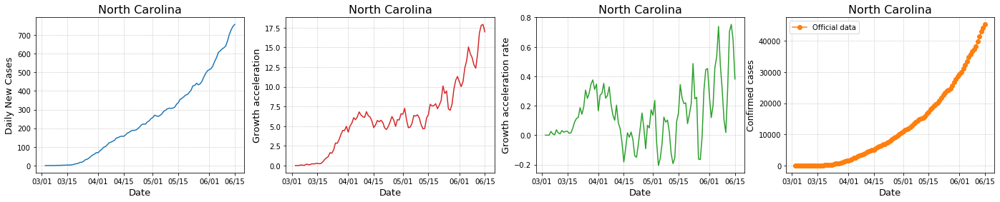

New Jersey


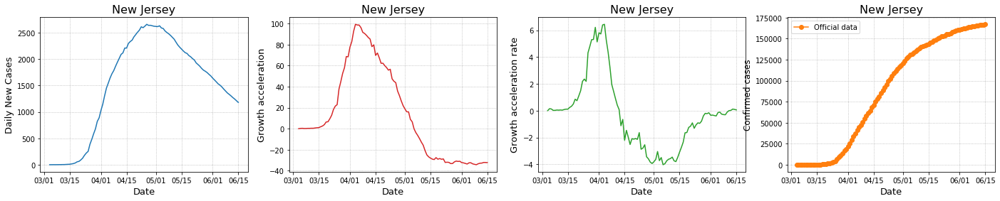

Colorado


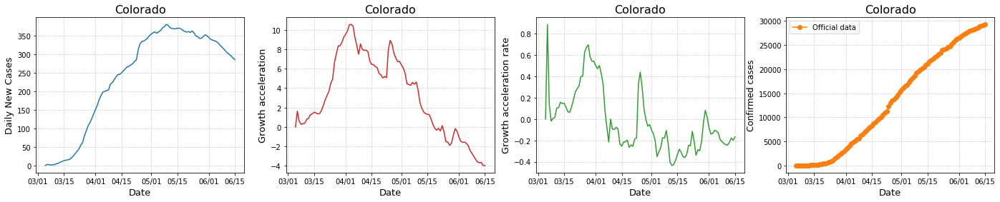

Maryland


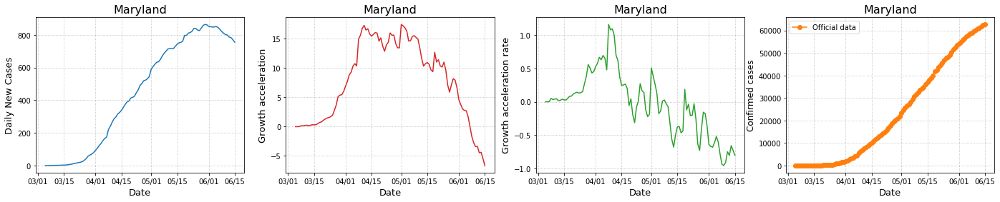

Nevada


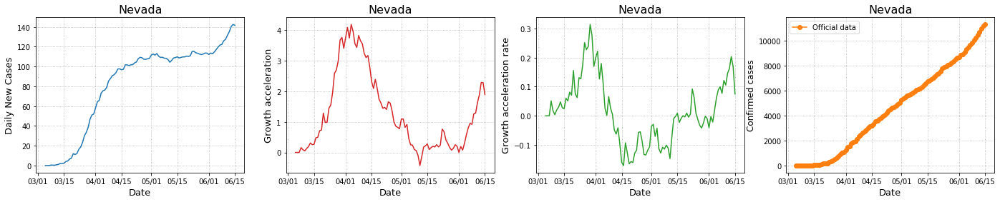

Tennessee


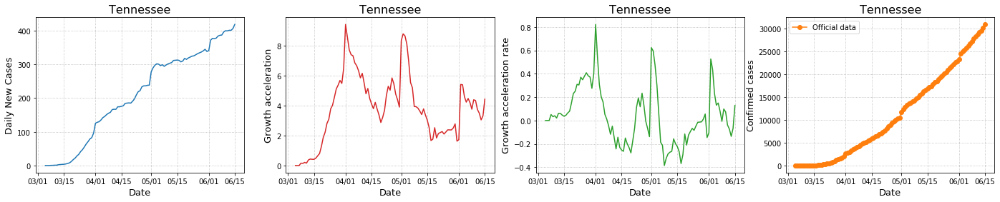

Hawaii


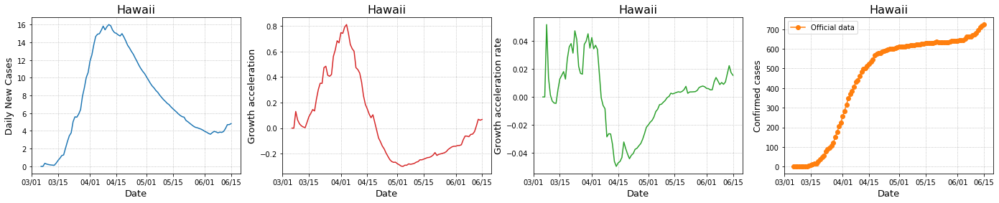

Indiana


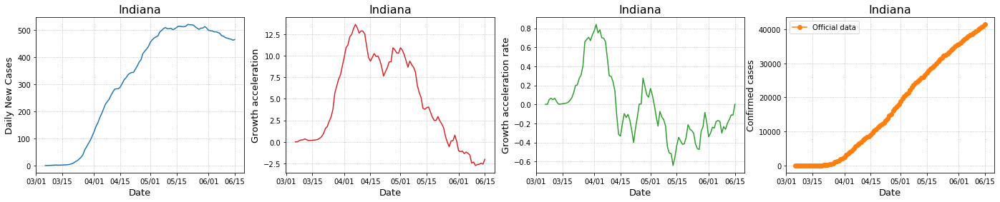

Kentucky


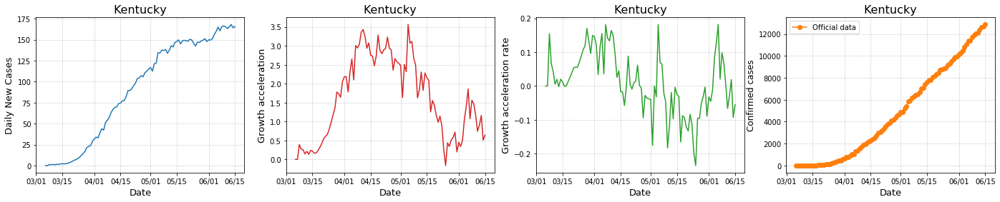

Minnesota


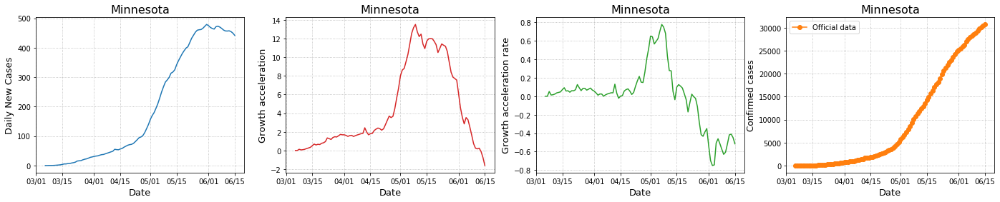

Oklahoma


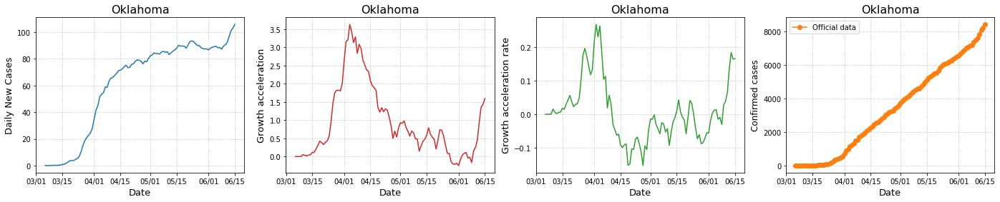

Pennsylvania


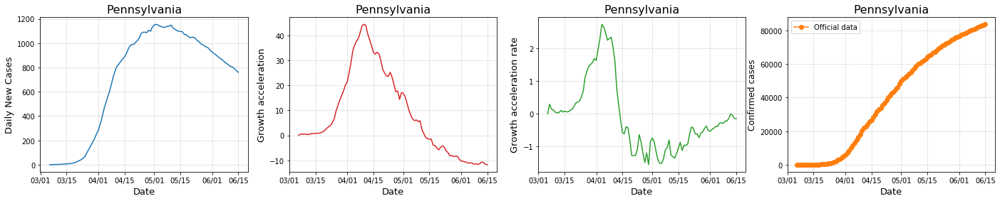

South Carolina


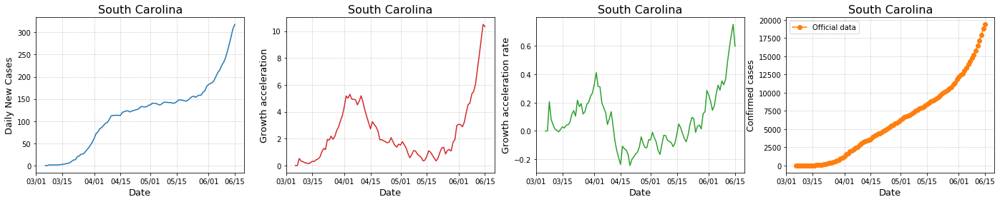

District of Columbia


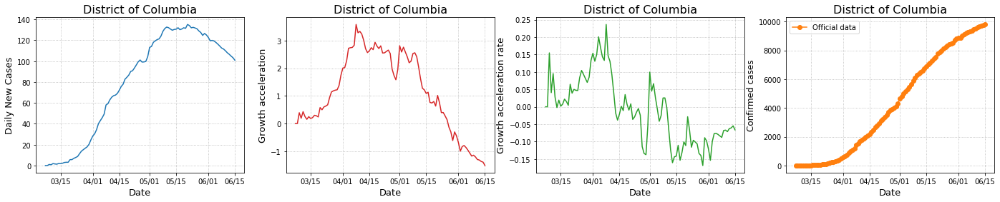

Kansas


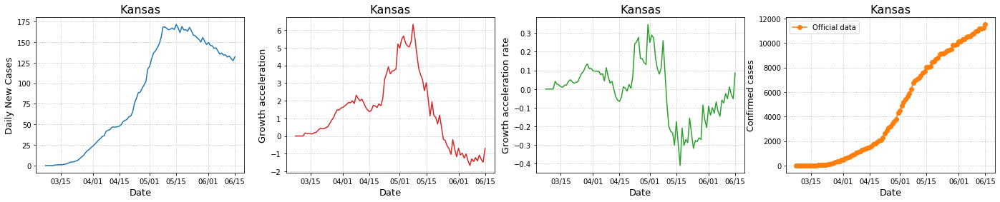

Missouri


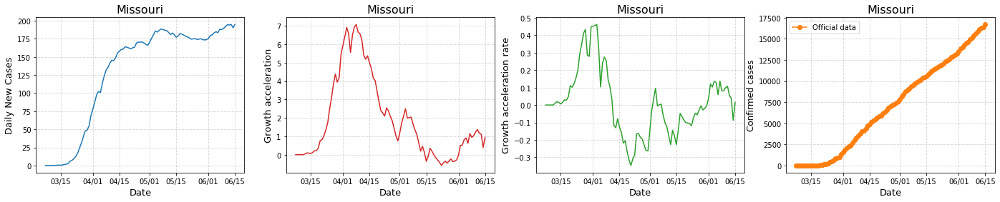

Vermont


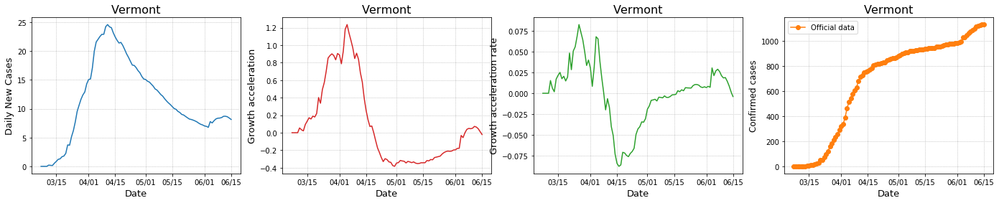

Virginia


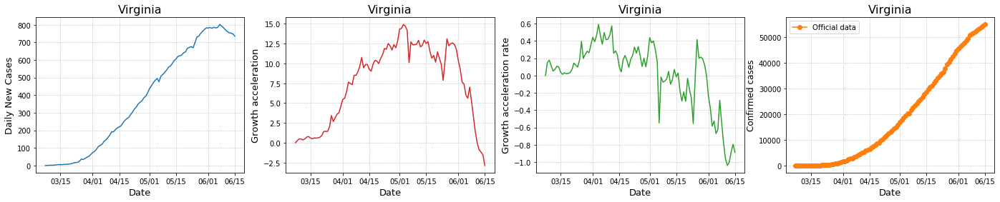

Connecticut


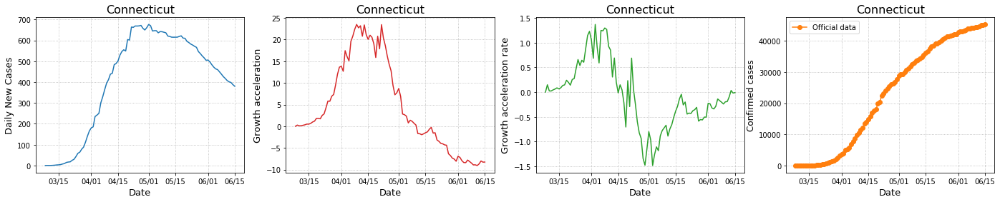

Iowa


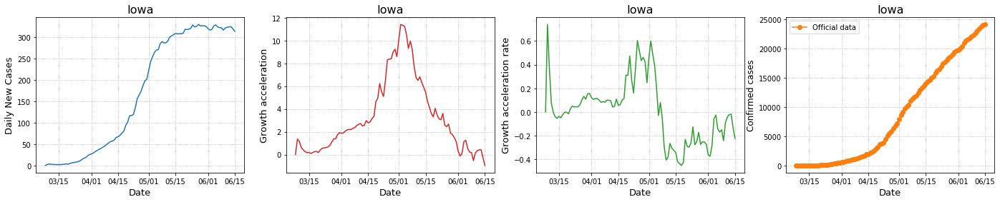

Louisiana


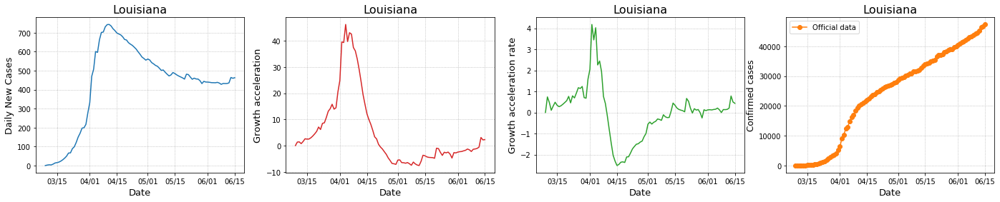

Ohio


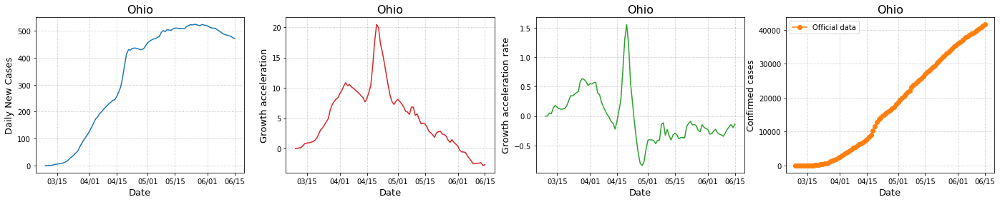

Michigan


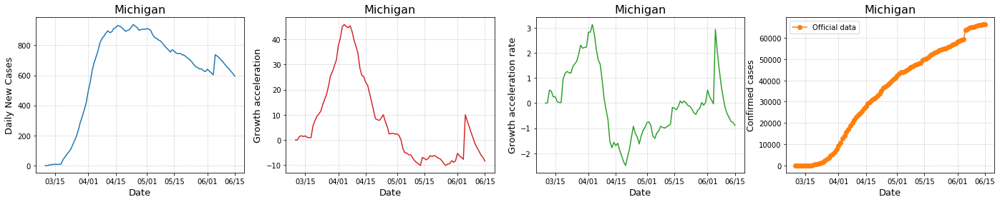

South Dakota


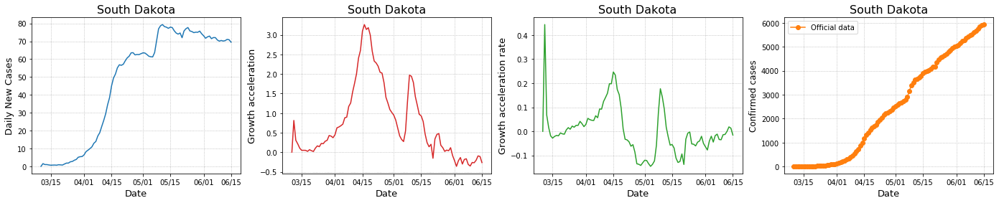

Arkansas


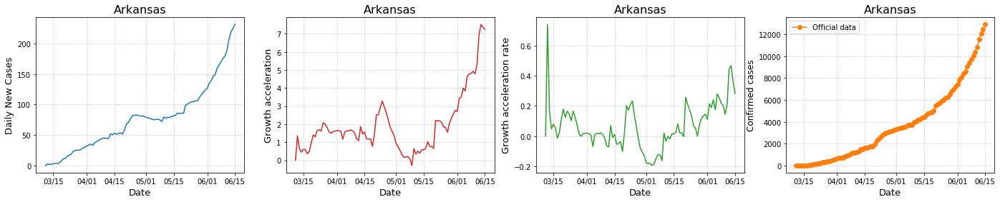

Delaware


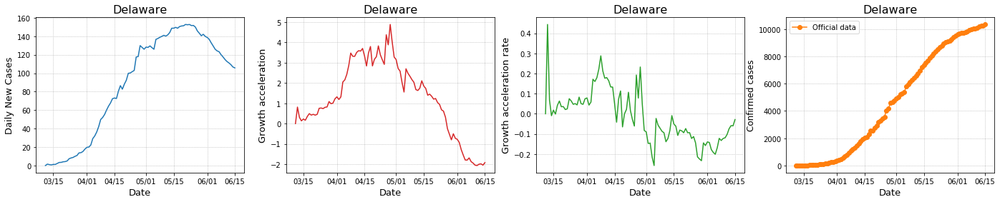

Mississippi


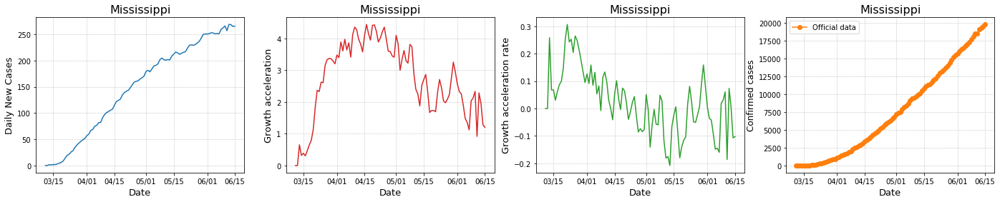

New Mexico


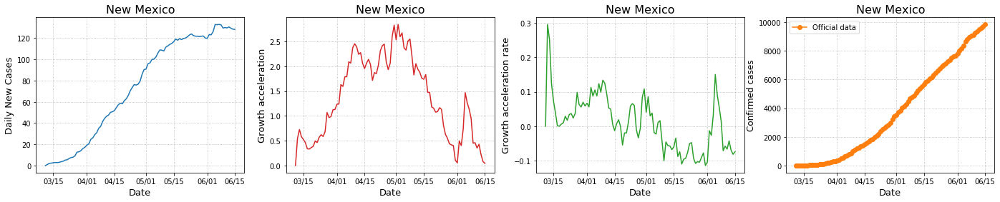

North Dakota


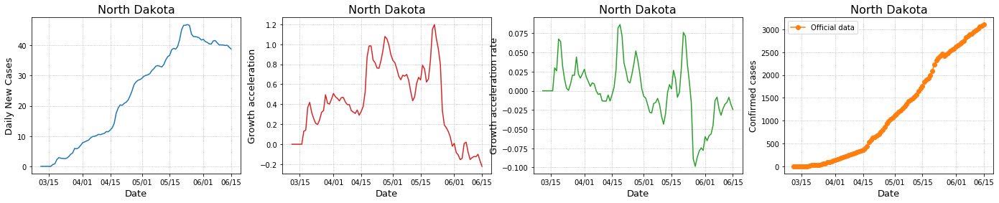

Wyoming


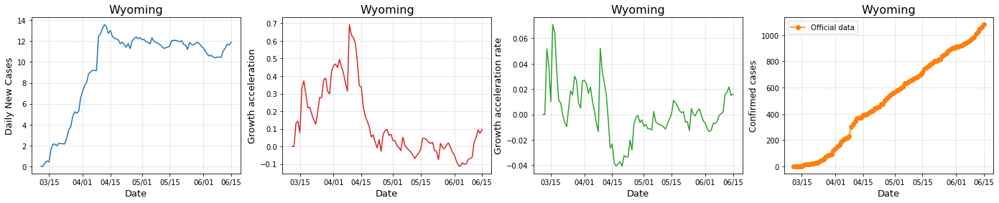

Alaska


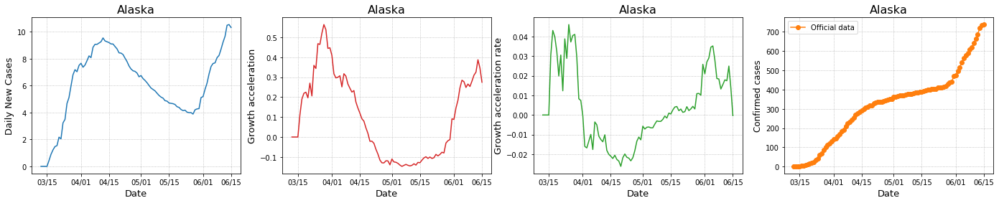

Maine


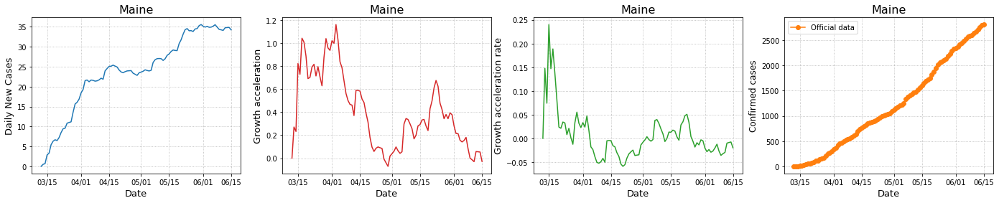

Alabama


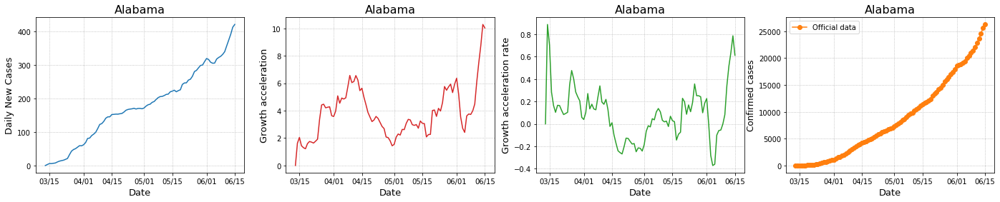

Idaho


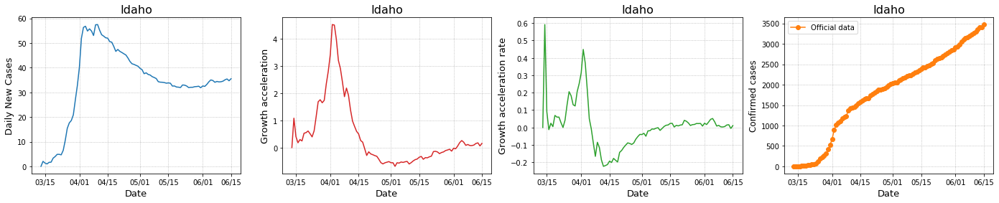

Montana


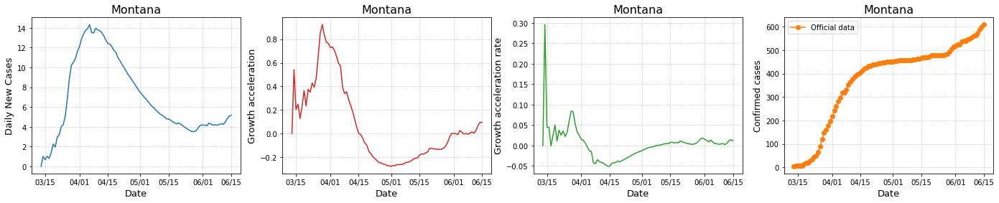

Puerto Rico


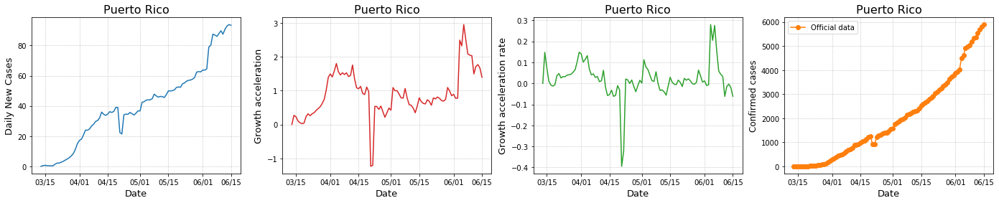

Virgin Islands


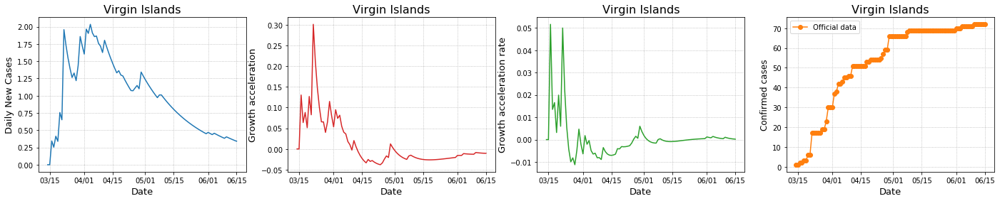

Guam


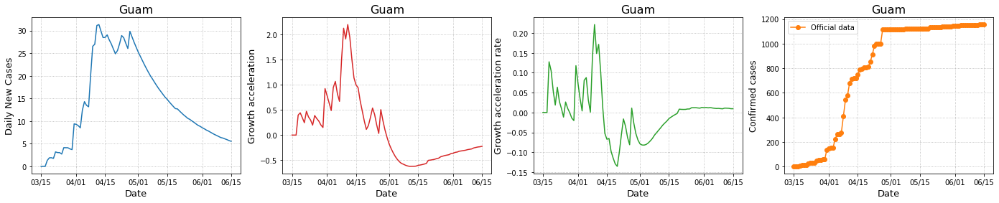

West Virginia


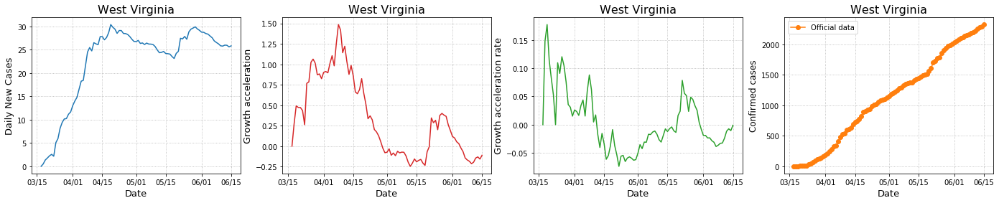

Northern Mariana Islands


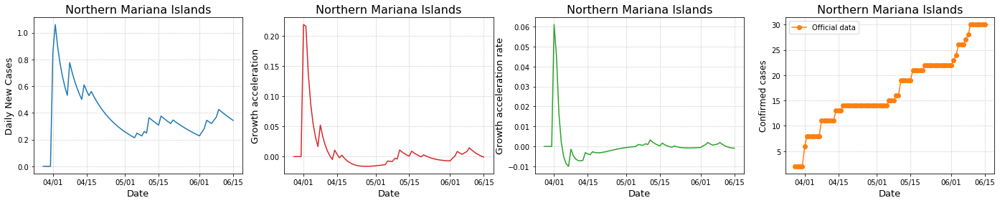

In [19]:
results_ = []

### EWM
alpha = 30.
alpha2 = 7.
alpha3 = 5.

### Classification threshold
# Cases
CASES_threshold = 50
# Normalized growth rate (%)
GROWTH_RATE_threshold = 1
# Normalized growth acceleration (%)
GROWTH_ACCEL_threshold = 0.01

### Last date into results_ list?
last = True
### If not, what date? (Do no forget to set last = False)
#### CAREFUL: a location might not have data for this particular day (some places do not have records on sundays, for instance)
#until_date = '2020-05-02'

for states in states_:

    print(states)

    df_ = df[ df['state'] == states].sort_values(by='date').set_index('date')
    df_ =  df_ [ df_['cases']  > 0]
    df_.index = pd.to_datetime(df_.index)

    # Rate
    df_['growth_rate_'] = delta(df_['cases'])

    # Exponential weight
    df_['growth_rate'] = df_['growth_rate_'].ewm(com= alpha).mean()

    # Rate
    df_['growth_accel_'] = delta(df_['growth_rate'])

    # Exponential weight
    df_['growth_accel'] = df_['growth_accel_'].ewm(com= alpha2).mean()

    # Rate
    df_['growth_accel_rate_'] = delta(df_['growth_accel'])

    # Exponential weight
    df_['growth_accel_rate'] = df_['growth_accel_rate_'].ewm(com= alpha3).mean()

    # Dropping unsmoothed quantities
    df_ = df_.drop('growth_rate_', axis=1)
    df_ = df_.drop('growth_accel_', axis=1)
    df_ = df_.drop('growth_accel_rate_', axis=1)

    # Normalized quantities
    df_['growth_rate_NORM_(%)'] = 100*df_['growth_rate'] / df_['cases']
    df_['growth_accel_NORM_(%)'] = 100*df_['growth_accel'] / df_['cases']
    df_['growth_accel_rate_NORM_(%)'] = 100*df_['growth_accel_rate'] / df_['cases']

    # Classification

    df_['LENTO'] =  (df_['cases'] < CASES_threshold)*1

    df_['EXPONENCIAL'] = ( df_['growth_accel_NORM_(%)']  >= GROWTH_ACCEL_threshold )*1

    df_['DESACELERACAO'] = ( df_['growth_accel_NORM_(%)']  <= -GROWTH_ACCEL_threshold )*1

    df_['ESTAVEL'] = ( (df_['growth_rate_NORM_(%)']  <  GROWTH_RATE_threshold) &  (df_['growth_accel_NORM_(%)']  > - GROWTH_ACCEL_threshold) & (df_['growth_accel_NORM_(%)']  <         GROWTH_ACCEL_threshold) )*1

    df_['LINEAR'] = ( (df_['growth_rate_NORM_(%)']  >=  GROWTH_RATE_threshold ) &  (df_['growth_accel_NORM_(%)']  > - GROWTH_ACCEL_threshold) & (df_['growth_accel_NORM_(%)']  < GROWTH_ACCEL_threshold) )*1


    df_.loc[df_['LENTO'] == True, 'CLASSIFICACAO'] = 'LENTO'
    df_.loc[ (df_['LENTO'] != True) & (df_['DESACELERACAO'] == True), 'CLASSIFICACAO'] = 'DESACELERACAO'
    df_.loc[ (df_['LENTO'] != True) & (df_['ESTAVEL'] == True), 'CLASSIFICACAO'] = 'ESTAVEL'
    df_.loc[ (df_['LENTO'] != True) & (df_['LINEAR'] == True), 'CLASSIFICACAO' ] = 'LINEAR'
    df_.loc[ (df_['LENTO'] != True) & (df_['EXPONENCIAL'] == True), 'CLASSIFICACAO' ] = 'EXPONENCIAL'

    # Plot
    fig, axes = plt.subplots(1, 4, figsize= (24, 4))
    
        
    axes[0].plot(df_['growth_rate'])
    axes[0].set_title(states, fontsize= 16)
    axes[0].set_ylabel('Daily New Cases', fontsize= 13)
    axes[0].set_xlabel('Date', fontsize= 13)
    axes[0].grid(linestyle=':')
    #axes[0].legend()

    axes[1].plot(df_['growth_accel'], color= 'C3')
    axes[1].set_title(states, fontsize= 16)
    axes[1].set_ylabel('Growth acceleration', fontsize= 13)
    axes[1].set_xlabel('Date', fontsize= 13)
    axes[1].grid(linestyle=':')
    #axes[1].legend()

    axes[2].plot(df_['growth_accel_rate'], color= 'C2')
    axes[2].set_title(states, fontsize= 16)
    axes[2].set_ylabel('Growth acceleration rate', fontsize= 13)
    axes[2].set_xlabel('Date', fontsize= 13)
    axes[2].grid(linestyle=':')
    #axes[2].legend()

    axes[3].plot(df_[['cases']], 'o-', color= 'C1', label= 'Official data')
    axes[3].set_ylabel('Confirmed cases', fontsize= 12)
    axes[3].set_title(states, fontsize= 16)
    axes[3].set_xlabel('Date', fontsize= 13)
    axes[3].grid(linestyle=':')
    axes[3].legend()
    #axes[3].set_yscale('log')

    date_form = DateFormatter("%m/%d")
    axes[0].xaxis.set_major_formatter(date_form)
    axes[1].xaxis.set_major_formatter(date_form)
    axes[2].xaxis.set_major_formatter(date_form)
    axes[3].xaxis.set_major_formatter(date_form)

    df_ = df_.reset_index()

    if last:
        results_.append(df_.iloc[-1].to_dict())
    else:
        idx_ = df_.index[df_['date'] == until_date]
        if len(idx_) > 0:
            results_.append(df_.iloc[idx_[0]].to_dict())
        else:
            print('%s data NOT available for %s' % (until_date, states))

    #plt.savefig('file_name.png', bbox_inches='tight')
    plt.show()

results = pd.DataFrame(results_)

#results.to_csv('results/dfs/growth_states_US_class_.csv', index= True, sep= ';')